# **Notebook 1 - Preliminary peek into the data**

## **How to use the Juypter notebooks?**
The notebooks were written with the intention to guide the readers through our study and how we have used the eReefs database.

Explanations and external links are provided accordingly to justify the actions and commands used to manipulate the eReefs data.

Let's get started!! :)

___

## **Preliminary analysis**
Before we look into the impact of flooding on seagrass community, we want to know what is the general relationship between different environmental variables, seagrass nitrogen, and seagrass production.

Therefore, in this notebook, we will be using the monthly data and extract environmental parameters that are highly relevant to the seagrass community.

___ 

## **Part 1 - Extract monthly data**
First, we want to extract the available data from the **BioGeoChemical models (GBR4_H2p0_B3p1_Cq3b_Dhnd)**.
Essentially there are tonnes of parameters that are potentially relevant to the growth and health of seagrass bed.

From the data, we have extracted six environmental variables and six seagrass parameters:

- <font color=#6bf51b>**SG_N**</font>: nitrogen biomass of *Zostera* species
- <font color=#6bf51b>**SG_N_pr**</font>: net production of *Zostera* species
- <font color=#5cbd24>**SGH_N**</font>: nitrogen biomass of *Halophila* species
- <font color=#5cbd24>**SGH_N_pr**</font>: net production of *Halophila* species
- <font color=#3d8713>**SGD_N**</font>: nitrogen biomass of Deep seagrass, parameterised to be similar to *alophila deciphens*
- <font color=#3d8713>**SGD_N_pr**</font>: net production of Deep seagrass, parameterised to be similar to *alophila deciphens*

See more explanations about the different type of nitrogen in                   https://ereefs.aims.gov.au/ereefs-aims/gbr4/bgc/baseline/ma-n_sg-n_sgh-n_sgd-n
     
To control the scale of our study, we mainly concern about the effect of the following environmental parameters:
    
- **temp**: temperature 
- **salt**: salinity
- **EpiPAR_sg**: light intensity above seagrass
- **FineSed**: fine sediment/ turbidity
- **DIN**: Dissolved Inorganic Nitrogen
- **DOR_N**: Dissolved Organic Nitrogen    

Also see more infomation about the details (long_name, unit, array size, etc.) of variables here on https://thredds.ereefs.aims.gov.au/thredds/dodsC/GBR4_H2p0_B3p1_Cq3b_Dhnd/monthly.nc.html

---

## **Geographical scope of the study**
Obviously, we cannot look at all the location of seagrass bed in Australia with the limited time and computational resources.
Therefore, we limit our scope of study to areas with high seagrass biomass and coverage according to spatial analysis of seagrass habitat by Carter et al. (2021). We have chosen the following sites and explained the significance of the selection below:

- <font color=purple>**Cleveland Bay**</font>:
   - **(1)** Not very affected by Burdekin Catchment but close to a smaller river system, Ross River
   - **(2)** lat_bounds, lon_bounds = [ -19.3, -19.1 ], [ 146.75 , 147 ]
- <font color=purple>**Upstart Bay**</font>: (*see Figure 6 in Carter et al. (2021)*)
   - **(1)** Adjacent to the Burdekin River Mouth
   - **(2)** lat_bounds, lon_bounds = [ -19.85, -19.7 ], [ 147.55 , 147.75]
- <font color=purple>**Gladstone**</font>:
   - **(1)** Some farming and urbanised/industrialised areas and close to the Calliope River
   - **(2)** Lots of seagrass according to the Seagrass Mapping Synthesis survey
   - **(3)** lat_bounds, lon_bounds = [-23.67, -23.9 ], [ 151.1 , 151.35 ]
- <font color=purple>**River Heads**</font>:
   - **(1)** Close to Mary River
   - **(2)** lat_bounds, lon_bounds = [ -25.23, -25.53 ], [ 153 , 152.8 ]

___ 

### **Import library**

In [38]:
import os
import scipy
import numpy as np
import pandas as pd
import xarray as xr
from scipy import stats
from scipy.spatial import cKDTree

import io
import requests

import urllib.request
import datetime as dt
from dateutil.relativedelta import *

import netCDF4
from netCDF4 import Dataset, num2date

import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
cartopy.config['data_dir'] = os.getenv('CARTOPY_DIR', cartopy.config.get('data_dir'))

import seaborn as sns
import warnings
warnings.simplefilter('ignore')

from matplotlib import pyplot as plt
%matplotlib inline

plt.rcParams['figure.figsize'] = (12,7)


___ 

### **Extract Data from AIMS eReefs THREDDS Server**

In [7]:
## provide baseline model path (Cq3b)
baseline_path_monthly = 'https://thredds.ereefs.aims.gov.au/thredds/dodsC/GBR4_H2p0_B3p1_Cq3b_Dhnd/monthly.nc'
baseline_data_monthly = xr.open_dataset(baseline_path_monthly)


## provide baseline model path (Cq3P)
preindustrial_path_monthly = 'https://thredds.ereefs.aims.gov.au/thredds/dodsC/GBR4_H2p0_B3p1_Cq3P_Dhnd/monthly.nc'
preindustrial_data_monthly = xr.open_dataset(preindustrial_path_monthly)


## understand the content of the data file
## they should be the same
# print('baseline variables:') 
# print(list(baseline_data_monthly.variables.keys()))
# print('preindustrial variables:') 
# print(list(preindustrial_data_monthly.variables.keys()))

### **The 12 variables of interest in the session**

In [8]:
## make a list of the 12 variables that we want to extract
variables = [
    'temp',       # temperature
    'salt',       # salinity
    'EpiPAR_sg',  # Light intensity above seagrass
    'DIN',        # Dissolved Inorganic Nitrogen
    'DOR_N',      # Dissolved Organic Nitrogen
    'FineSed',    # The turbidity
    'SG_N',       # Seagrass nitrogen
    'SG_N_pr',    # Seagrass net production
    'SGH_N',      # Halophila nitrogen
    'SGH_N_pr',   # Halophila net production
    'SGD_N',      # Deep seagrass nitrogen
    'SGD_N_pr',   # Deep seagrass net production
]


## extract the wanted variables and choose only the top layer
baseline_data = baseline_data_monthly[variables].isel(k=-1).drop('zc')
preindustrial_data = preindustrial_data_monthly[variables].isel(k=-1).drop('zc')


In [0]:
## is that what we want?
baseline_data

In [0]:
## is that what we want?
preindustrial_data

In [4]:
## saving baseline data from the 4 sites into 4 independent files

## save baseline data from Cleveland Bay
lat_bounds, lon_bounds = [ -19.3, -19.1 ], [ 146.8, 147 ]
baseline_data_Cleveland_Bay = baseline_data.sel(latitude=slice(*lat_bounds), longitude=slice(*lon_bounds))
baseline_data_Cleveland_Bay.to_netcdf("baseline_data_Cleveland_Bay_monthly.nc")


## save baseline data from Upstart Bay
lat_bounds, lon_bounds = [ -19.85, -19.7 ], [ 147.55, 147.75 ]
baseline_data_Upstart_Bay = baseline_data.sel(latitude=slice(*lat_bounds), longitude=slice(*lon_bounds))
baseline_data_Upstart_Bay.to_netcdf("baseline_data_Upstart_Bay_monthly.nc")


## save baseline data from Gladstone
lat_bounds, lon_bounds = [-23.9, -23.67 ], [ 151.1, 151.35 ]
baseline_data_Gladstone = baseline_data.sel(latitude=slice(*lat_bounds), longitude=slice(*lon_bounds))
baseline_data_Gladstone.to_netcdf("baseline_data_Gladstone_monthly.nc")


## save baseline data from River Heads
lat_bounds, lon_bounds = [ -25.53, -25.23 ], [ 152.8, 153 ]
baseline_data_River_Heads = baseline_data.sel(latitude=slice(*lat_bounds), longitude=slice(*lon_bounds))
baseline_data_River_Heads.to_netcdf("baseline_data_River_Heads_monthly.nc")


In [13]:
## saving preindustrial data from the 4 sites into 4 independent files
## note that if the boundaries go from small to large or you get nothing

## save preindustrial data from Cleveland Bay
lat_bounds, lon_bounds = [ -19.3, -19.1 ], [ 146.8, 147 ]
preindustrial_data_Cleveland_Bay = preindustrial_data.sel(latitude=slice(*lat_bounds), longitude=slice(*lon_bounds))
preindustrial_data_Cleveland_Bay.to_netcdf("preindustrial_data_Cleveland_Bay_monthly.nc")


## save preindustrial data from Upstart Bay
lat_bounds, lon_bounds = [ -19.85, -19.7 ], [ 147.55, 147.75 ]
preindustrial_data_Upstart_Bay = preindustrial_data.sel(latitude=slice(*lat_bounds), longitude=slice(*lon_bounds))
preindustrial_data_Upstart_Bay.to_netcdf("preindustrial_data_Upstart_Bay_monthly.nc")


## save preindustrial data from Gladstone
lat_bounds, lon_bounds = [-23.9, -23.67 ], [ 151.1, 151.35 ]
preindustrial_data_Gladstone = preindustrial_data.sel(latitude=slice(*lat_bounds), longitude=slice(*lon_bounds))
preindustrial_data_Gladstone.to_netcdf("preindustrial_data_Gladstone_monthly.nc")


## save preindustrial data from River Heads
lat_bounds, lon_bounds = [ -25.53, -25.23 ], [ 152.8, 153 ]
preindustrial_data_River_Heads = preindustrial_data.sel(latitude=slice(*lat_bounds), longitude=slice(*lon_bounds))
preindustrial_data_River_Heads.to_netcdf("preindustrial_data_River_Heads_monthly.nc")


___
---

## **Part 2 - Find the correlation between the extracted variables**
Now that we have successfully extracted the monthly data and the 12 variables, we want to quickly check how these variables are correlated with each other.

### **Why look at the correlations?**
While there are so many environmental variables  that are relevant to seagrass, we cannot analyze all due to limited time and computational resources.
In this part, we look at parameters that are highly correlated and remove it from subsequent analysis to resude the scale of the study while putting more focus on variables that matter mosts.

___

### **Data wrangling**
To find the correlation between all the variables within the whole site instead of just looking at one block, we first averaged the data covered by the designated area before assess the corelation between the variables.

Procedures for each site in each scenario:
- Average the data points in each month over all the grids along longitude and latitude
- Make a new data frame and store as cvs for later graph plotting
- Add column names
- Plot correlation matrix for visualization

In [0]:
## open nc monthly data files of each site
##   for both baseline and preindustrial models

## define a function to calculate the mean value of grids of each day
def calculate_mean_df(dataset, model, site):
    data = dataset
    variables = ["temp", "salt", "EpiPAR_sg", "DIN", "DOR_N", "FineSed",
                  "SG_N", "SG_N_pr", "SGH_N", "SGH_N_pr", "SGD_N", "SGD_N_pr"]
    means = {}

    for variable in variables:
        mean_df = pd.DataFrame(data[variable].mean(dim=("longitude", "latitude")))
        means[variable] = mean_df

    df = pd.concat(means, axis=1, join="inner")
    df.columns = ["temp_mean", "salt_mean", "EpiPAR_sg_mean", "DIN_mean", "DOR_N_mean", "FineSed_mean",
                  "SG_N_mean", "SG_N_pr_mean", "SGH_N_mean", "SGH_N_pr_mean", "SGD_N_mean", "SGD_N_pr_mean"]
    df.to_csv(f"{model}_{site}_monthly_df.csv", index=False)


## open nc data files of each year from 2012-2014 for both baseline and preindustrial models
## and save results in csv files for later analyses
models = ["baseline_data", "preindustrial_data"]
sites = ["Cleveland_Bay", "Upstart_Bay", "Gladstone", "River_Heads"]

for model in models:
    for site in sites:
        dataset = xr.open_dataset(f"{model}_{site}_monthly.nc")
        calculate_mean_df(dataset, model, site)

---

### **Visualization** for the statistical correlations between environmental variables and seagrass nitrogen and productivity
Following a tutorial from stackoverflow, we visualize the correlation with a correlation matrix plot.
- Reference: https://stackoverflow.com/questions/48139899/correlation-matrix-plot-with-coefficients-on-one-side-scatterplots-on-another

In [35]:
# we modified the correlation method to spearman so that the impact of outliers are minimized
def corrdot(*args, **kwargs):
    corr_r = args[0].corr(args[1], 'spearman')
    corr_text = f"{corr_r:2.2f}".replace("0.", ".")
    ax = plt.gca()
    ax.set_axis_off()
    marker_size = abs(corr_r) * 10000
    ax.scatter([.5], [.5], marker_size, [corr_r], alpha=0.6, cmap="coolwarm",
               vmin=-1, vmax=1, transform=ax.transAxes)
    font_size = abs(corr_r) * 40 + 5
    ax.annotate(corr_text, [.5, .5,],  xycoords="axes fraction",
                ha='center', va='center', fontsize=font_size)


## define a function that help visualize statistical significance for the correlation
def corrfunc(x, y, **kws):
    r, p = stats.spearmanr(x, y)
    p_stars = ''
    if p <= 0.05:
        p_stars = '*'
    if p <= 0.01:
        p_stars = '**'
    if p <= 0.001:
        p_stars = '***'
    ax = plt.gca()
    ax.annotate(p_stars, xy=(0.65, 0.6), xycoords=ax.transAxes,
                color='black', fontsize=25)


---
---

### **Preperation done and ready for graph plotting!**

**Site 1** - *Cleveland Bay* - Baseline

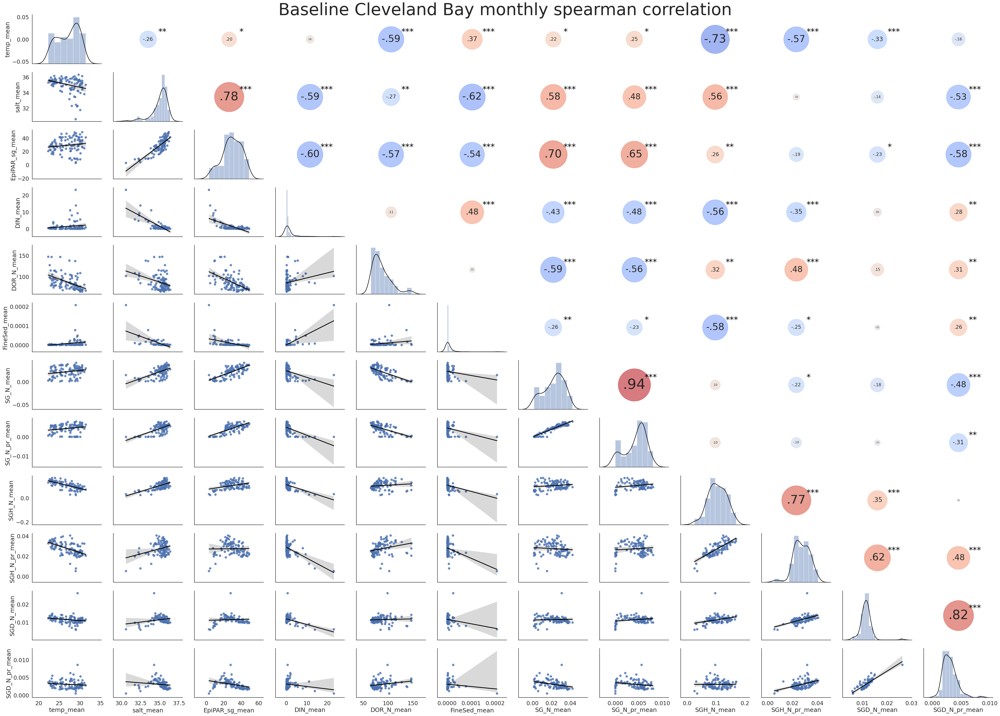

In [25]:
## load downloaded monthly data
baseline_Cleveland_Bay_monthly_df = pd.read_csv("baseline_data_Cleveland_Bay_monthly_df.csv")


## plotting the correlation matrix plot for the report
sns.set(style='white', font_scale=1.5)
figure = sns.PairGrid(baseline_Cleveland_Bay_monthly_df, aspect=1.4, diag_sharey=False)
figure.map_lower(sns.regplot, lowess=False, ci=95, line_kws={'color': 'black'})
figure.map_diag(sns.distplot, kde_kws={'color': 'black'})
figure.map_upper(corrdot)
figure.map_upper(corrfunc)
figure.fig.suptitle("Baseline Cleveland Bay monthly spearman correlation", size = 50, y = 1)
figure.savefig("baseline_Cleveland_Bay_monthly_spearman.jpg")

**Site 1** - *Cleveland Bay* - Preindustrial

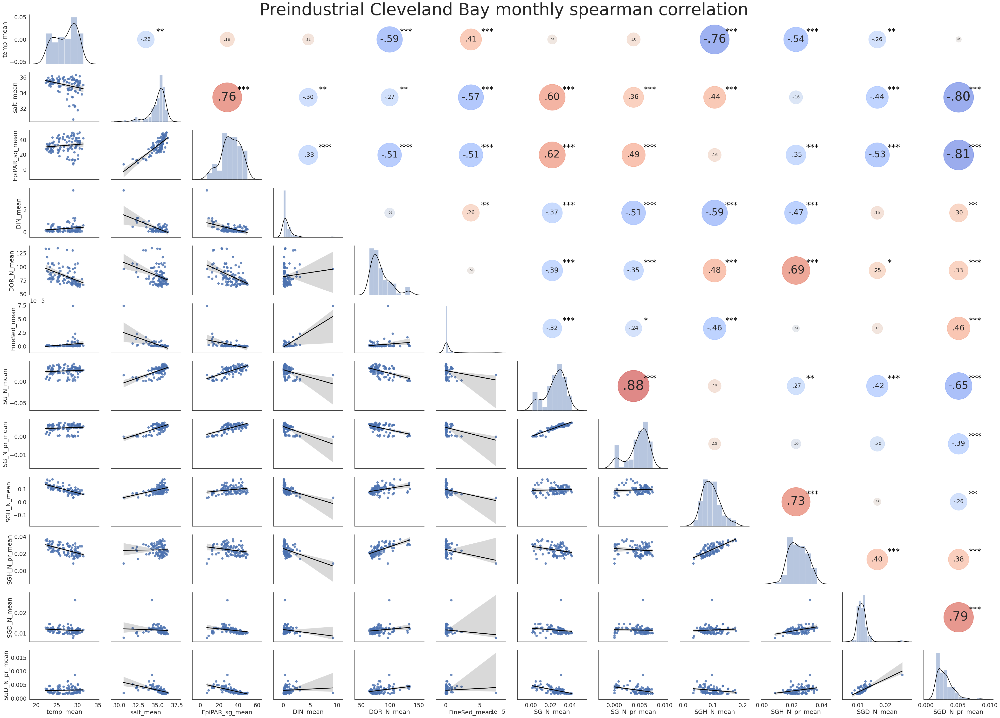

In [26]:
## load downloaded monthly data
preindustrial_Cleveland_Bay_monthly_df = pd.read_csv("preindustrial_data_Cleveland_Bay_monthly_df.csv")


## plotting the correlation matrix plot for the report
sns.set(style='white', font_scale=1.5)
figure = sns.PairGrid(preindustrial_Cleveland_Bay_monthly_df, aspect=1.4, diag_sharey=False)
figure.map_lower(sns.regplot, lowess=False, ci=95, line_kws={'color': 'black'})
figure.map_diag(sns.distplot, kde_kws={'color': 'black'})
figure.map_upper(corrdot)
figure.map_upper(corrfunc)
figure.fig.suptitle("Preindustrial Cleveland Bay monthly spearman correlation", size = 50, y = 1)
figure.savefig("preindustrial_Cleveland_Bay_monthly_spearman.jpg")

---

**Site 2** - *Upstart Bay* - Baseline

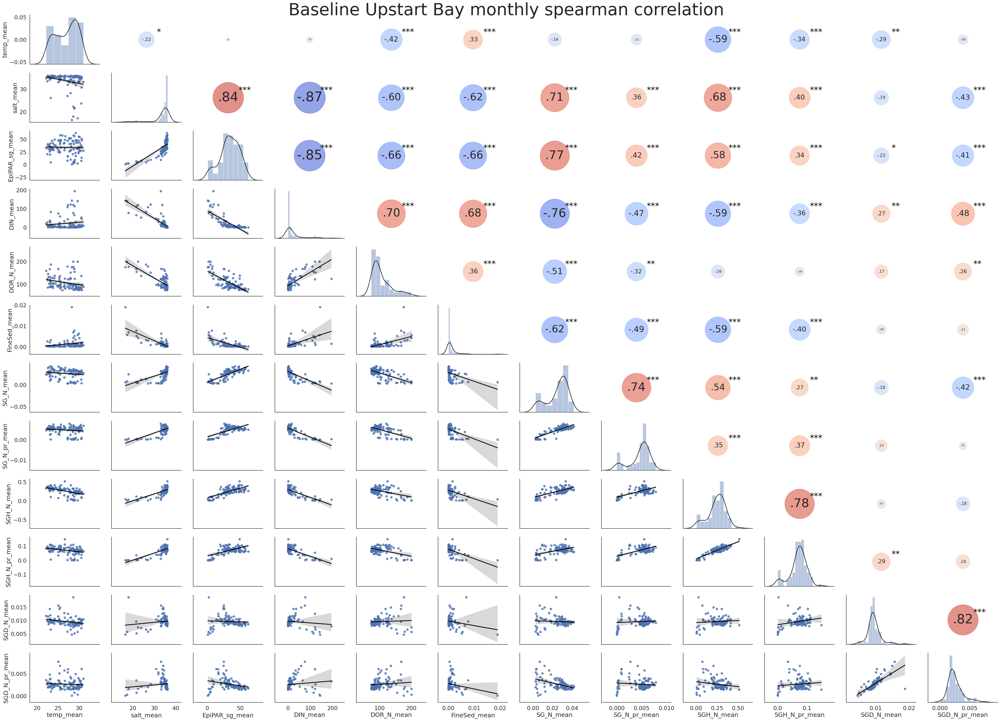

In [30]:
## load downloaded monthly data
baseline_Upstart_Bay_monthly_df = pd.read_csv("baseline_data_Upstart_Bay_monthly_df.csv")


## plotting the correlation matrix plot for the report
sns.set(style='white', font_scale=1.5)
figure = sns.PairGrid(baseline_Upstart_Bay_monthly_df, aspect=1.4, diag_sharey=False)
figure.map_lower(sns.regplot, lowess=False, ci=95, line_kws={'color': 'black'})
figure.map_diag(sns.distplot, kde_kws={'color': 'black'})
figure.map_upper(corrdot)
figure.map_upper(corrfunc)
figure.fig.suptitle("Baseline Upstart Bay monthly spearman correlation", size = 50, y = 1)
figure.savefig("baseline_Upstart_Bay_monthly_spearman.jpg")

**Site 2** - *Upstart Bay* - Preindustrial

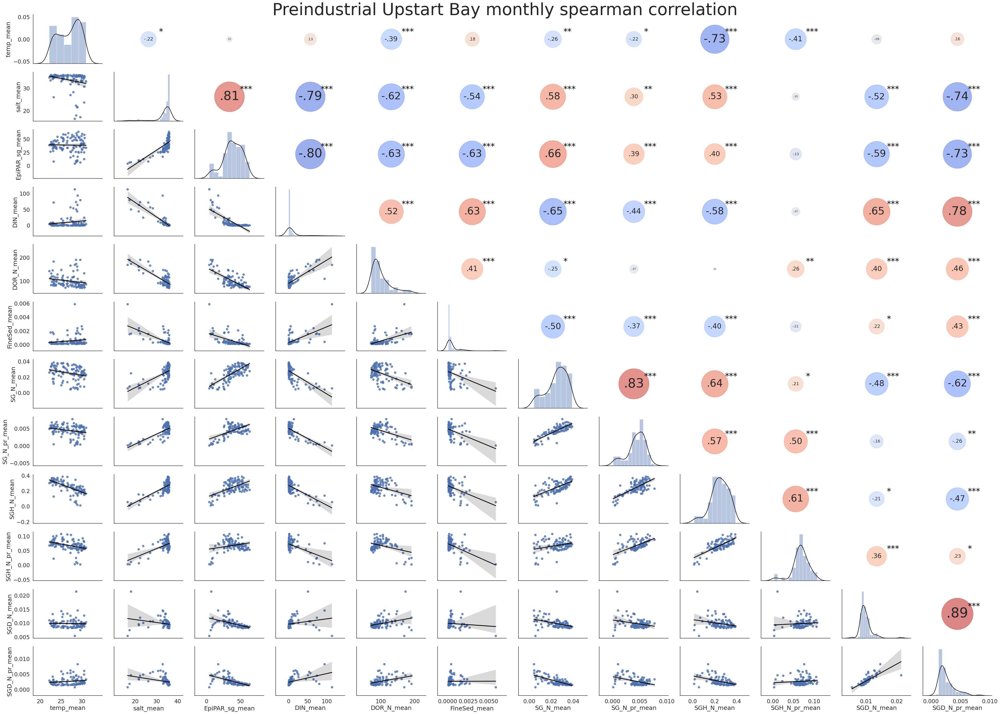

In [31]:
## load downloaded monthly data
preindustrial_Upstart_Bay_monthly_df = pd.read_csv("preindustrial_data_Upstart_Bay_monthly_df.csv")


## plotting the correlation matrix plot for the report
sns.set(style='white', font_scale=1.5)
figure = sns.PairGrid(preindustrial_Upstart_Bay_monthly_df, aspect=1.4, diag_sharey=False)
figure.map_lower(sns.regplot, lowess=False, ci=95, line_kws={'color': 'black'})
figure.map_diag(sns.distplot, kde_kws={'color': 'black'})
figure.map_upper(corrdot)
figure.map_upper(corrfunc)
figure.fig.suptitle("Preindustrial Upstart Bay monthly spearman correlation", size = 50, y = 1)
figure.savefig("preindustrial_Upstart_Bay_monthly_spearman.jpg")

---

**Site 3** - *Gladstone* - Baseline

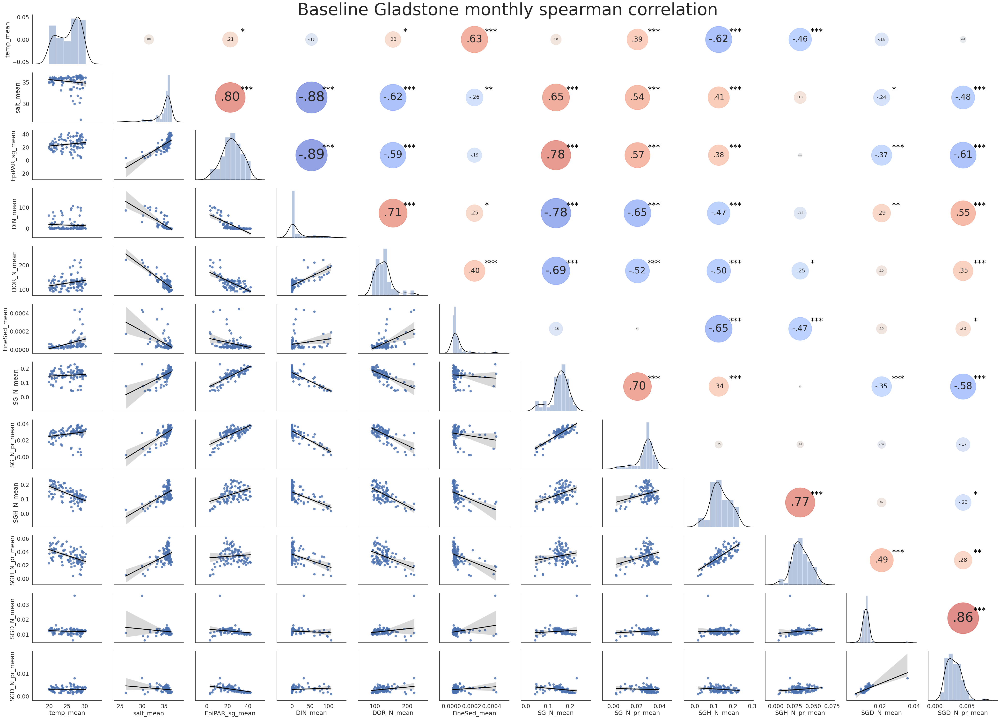

In [27]:
## load downloaded monthly data
baseline_Gladstone_monthly_df = pd.read_csv("baseline_data_Gladstone_monthly_df.csv")


## plotting the correlation matrix plot for the report
sns.set(style='white', font_scale=1.5)
figure = sns.PairGrid(baseline_Gladstone_monthly_df, aspect=1.4, diag_sharey=False)
figure.map_lower(sns.regplot, lowess=False, ci=95, line_kws={'color': 'black'})
figure.map_diag(sns.distplot, kde_kws={'color': 'black'})
figure.map_upper(corrdot)
figure.map_upper(corrfunc)
figure.fig.suptitle("Baseline Gladstone monthly spearman correlation", size = 50, y = 1)
figure.savefig("baseline_Gladstone_monthly_spearman.jpg")

**Site 3** - *Gladstone* - Preindustrial

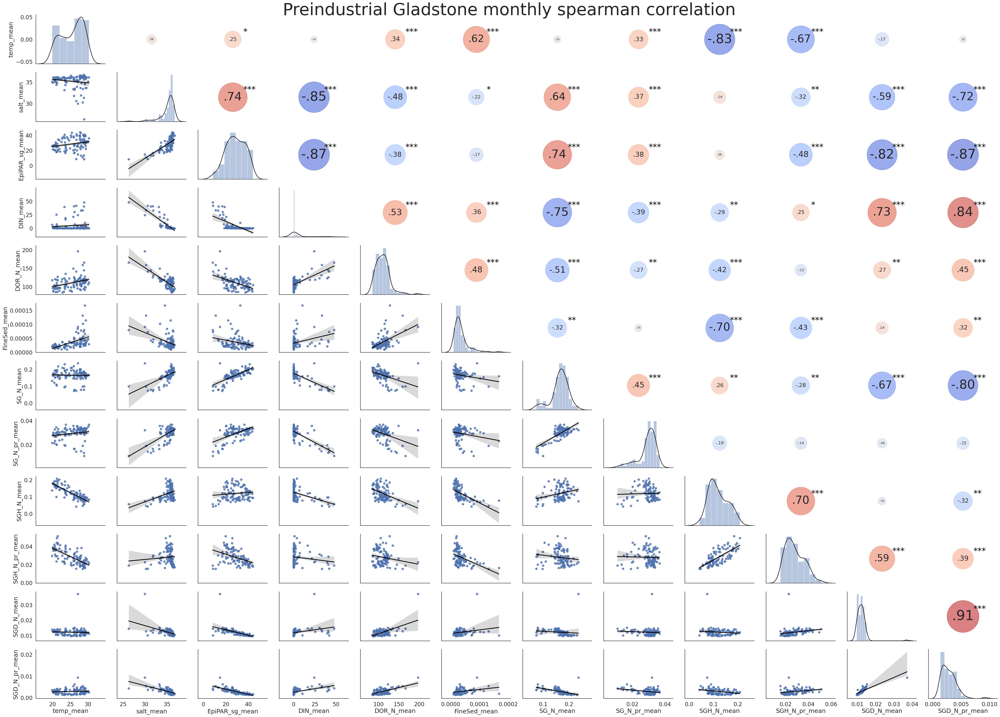

In [40]:
## load downloaded monthly data
preindustrial_Gladstone_monthly_df = pd.read_csv("preindustrial_data_Gladstone_monthly_df.csv")


## plotting the correlation matrix plot for the report
sns.set(style='white', font_scale=1.5)
figure = sns.PairGrid(preindustrial_Gladstone_monthly_df, aspect=1.4, diag_sharey=False)
figure.map_lower(sns.regplot, lowess=False, ci=95, line_kws={'color': 'black'})
figure.map_diag(sns.distplot, kde_kws={'color': 'black'})
figure.map_upper(corrdot)
figure.map_upper(corrfunc)
figure.fig.suptitle("Preindustrial Gladstone monthly spearman correlation", size = 50, y = 1)
figure.savefig("preindustrial_Gladstone_monthly_spearman.jpg")

---

**Site 4** - *River Heads* - Baseline

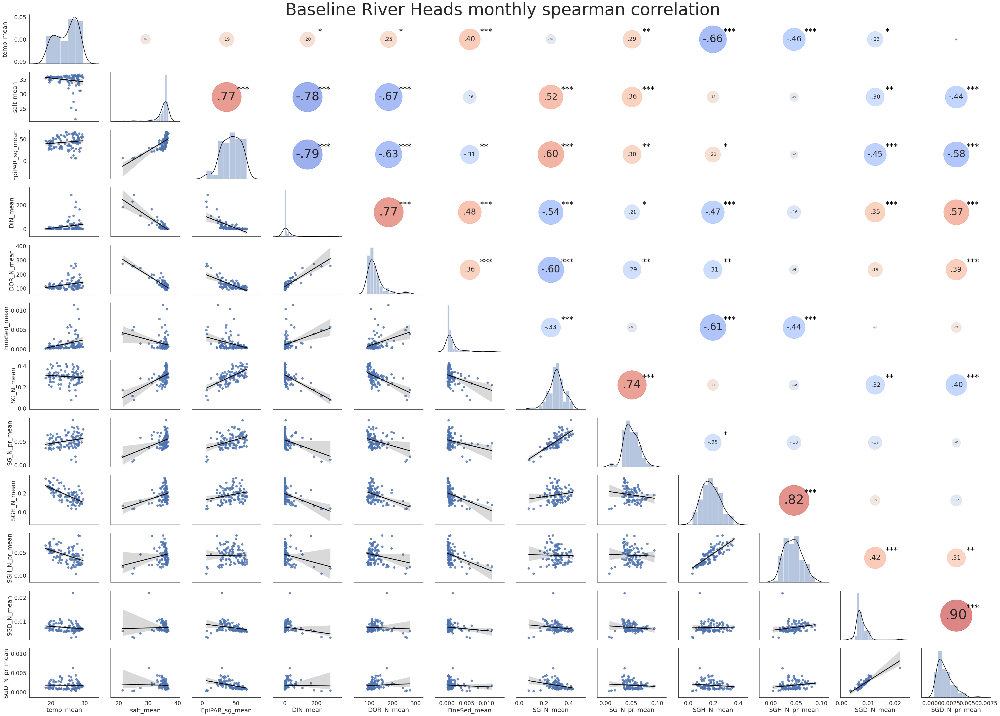

In [39]:
## load downloaded monthly data
baseline_River_Heads_monthly_df = pd.read_csv("baseline_data_River_Heads_monthly_df.csv")


## plotting the correlation matrix plot for the report
sns.set(style='white', font_scale=1.5)
figure = sns.PairGrid(baseline_River_Heads_monthly_df, aspect=1.4, diag_sharey=False)
figure.map_lower(sns.regplot, lowess=False, ci=95, line_kws={'color': 'black'})
figure.map_diag(sns.distplot, kde_kws={'color': 'black'})
figure.map_upper(corrdot)
figure.map_upper(corrfunc)
figure.fig.suptitle("Baseline River Heads monthly spearman correlation", size = 50, y = 1)
figure.savefig("baseline_River_Heads_monthly_spearman.jpg")

**Site 4** - *River Heads* - Preindustrial

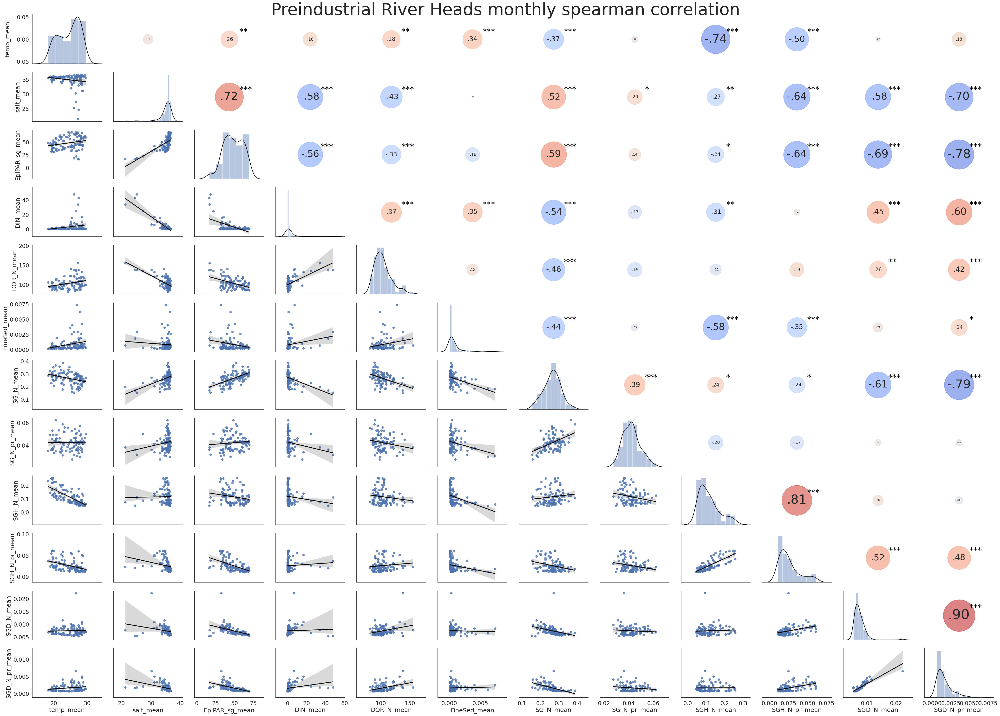

In [41]:
## load downloaded monthly data
preindustrial_River_Heads_monthly_df = pd.read_csv("preindustrial_data_River_Heads_monthly_df.csv")


## plotting the correlation matrix plot for the report
sns.set(style='white', font_scale=1.5)
figure = sns.PairGrid(preindustrial_River_Heads_monthly_df, aspect=1.4, diag_sharey=False)
figure.map_lower(sns.regplot, lowess=False, ci=95, line_kws={'color': 'black'})
figure.map_diag(sns.distplot, kde_kws={'color': 'black'})
figure.map_upper(corrdot)
figure.map_upper(corrfunc)
figure.fig.suptitle("Preindustrial River Heads monthly spearman correlation", size = 50, y = 1)
figure.savefig("preindustrial_River_Heads_monthly_spearman.jpg")

___